<h1>Capstone Project - Modelling

<img src="https://library.sportingnews.com/styles/twitter_card_120x120/s3/2022-03/cn.jpg?itok=4UFpH4_I" width="500">

###
The project aims to find solutions to the following problems:
<li>Let's say player X departs a team, and the team needs a player who is similar to the player who is departing.</li>
<li>Clubs occasionally fail to sign their top transfer targets for a variety of reasons. Then they would have to choose the best alternate signing.</li>
<li>Coaches occasionally have to select a versatile player to replace one who is currently playing in a different position owing to an injury or another circumstance. </li>


### Import Libraries

In [1]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.preprocessing import LabelEncoder
from tqdm import tqdm
import time

from sklearn import metrics
from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

import plotly.figure_factory as ff
import plotly.graph_objects as go
import plotly.express as px

import pickle

# from sklearn_som.som import SOM


### Functions

In [2]:
def plot_correlation(corr,figsize=(6,6)):

    """
    Plot correlation matrix
    i/p: corr
    """

    plt.figure(figsize = figsize) # setting the size of the output

    sns.heatmap(corr,
                annot = True,
                linecolor='black',
                center=0,
                vmin=-1,
                vmax=1,
                cmap = sns.diverging_palette(600,600, as_cmap=True),
                fmt='.4g')

    plt.title('Car features and thier correlation') # naming the plot

    #plt.savefig('plot.png', dpi = 300, bbox_inches = 'tight') # saving the chart as a .png – it will be saved in the current working directory

    plt.show()

def plot_cluster_evaluation(inertia, sc_score,k_range,inertia_title, sc_title):
    """Function to evaluate and visualise the inertia score (elbow method) as well as the silhouette coefficient"""

    sns.set_theme(style="whitegrid")
    fig, axs = plt.subplots(1, 2, figsize=(15, 8))
    plt.subplot(1, 2,1)
    plt.plot(k_range, inertia,color="#EF5B0C",marker='o')
    plt.xlabel('Number of clusters')
    plt.ylabel('inertia')
    plt.title(inertia_title)
    plt.grid(True)

    plt.subplot(1, 2, 2)
    plt.plot(k_range, sc_score,color="#FA2FB5",marker='o')
    plt.xlabel('Number of clusters')
    plt.ylabel('Silhouette Coefficient')
    plt.title(sc_title)
    plt.grid(True)



    plt.show()


### Load Data

In [3]:
player_df = pd.read_csv('data/player_abilities.csv', low_memory=False)
player_df.head()

,Unnamed: 0,sofifa_id,short_name,preferred_foot,overall,player_positions,weak_foot,skill_moves,work_rate,body_type,...,mentality_composure,defending_marking_awareness,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,goalkeeping_speed
0,0,158023,L. Messi,Left,93,"RW, ST, CF",4,4,Medium/Low,Unique,...,96,20,35,24,6,11,15,14,8,NaN
1,1,188545,R. Lewandowski,Right,92,ST,4,4,High/Medium,Unique,...,88,35,42,19,15,6,12,8,10,NaN
2,2,20801,Cristiano Ronaldo,Right,91,"ST, LW",4,5,High/Low,Unique,...,95,24,32,24,7,11,15,14,11,NaN
3,3,190871,Neymar Jr,Right,91,"LW, CAM",5,5,High/Medium,Unique,...,93,35,32,29,9,9,15,15,11,NaN
4,4,192985,K. De Bruyne,Right,91,"CM, CAM",5,4,High/High,Unique,...,89,68,65,53,15,13,5,10,13,NaN


In [4]:
player_df.shape

(19239, 51)

> ### There are 19239 male players in the dataset

Drop Unnamed column  

In [5]:
player_df.drop(columns=['Unnamed: 0'],inplace=True)
player_df.set_index('sofifa_id',inplace=True)
player_df.head()

,short_name,preferred_foot,overall,player_positions,weak_foot,skill_moves,work_rate,body_type,pace,shooting,...,mentality_composure,defending_marking_awareness,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,goalkeeping_speed
sofifa_id,,,,,,,,,,,,,,,,,,,,,
158023,L. Messi,Left,93,"RW, ST, CF",4,4,Medium/Low,Unique,85.0,92.0,...,96,20,35,24,6,11,15,14,8,NaN
188545,R. Lewandowski,Right,92,ST,4,4,High/Medium,Unique,78.0,92.0,...,88,35,42,19,15,6,12,8,10,NaN
20801,Cristiano Ronaldo,Right,91,"ST, LW",4,5,High/Low,Unique,87.0,94.0,...,95,24,32,24,7,11,15,14,11,NaN
190871,Neymar Jr,Right,91,"LW, CAM",5,5,High/Medium,Unique,91.0,83.0,...,93,35,32,29,9,9,15,15,11,NaN
192985,K. De Bruyne,Right,91,"CM, CAM",5,4,High/High,Unique,76.0,86.0,...,89,68,65,53,15,13,5,10,13,NaN


In [6]:
# saves the player names for future use
player_names = player_df['short_name']

In [7]:
player_df['goalkeeping_speed'].fillna(0,inplace=True)
player_df.head()

,short_name,preferred_foot,overall,player_positions,weak_foot,skill_moves,work_rate,body_type,pace,shooting,...,mentality_composure,defending_marking_awareness,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,goalkeeping_speed
sofifa_id,,,,,,,,,,,,,,,,,,,,,
158023,L. Messi,Left,93,"RW, ST, CF",4,4,Medium/Low,Unique,85.0,92.0,...,96,20,35,24,6,11,15,14,8,0.0
188545,R. Lewandowski,Right,92,ST,4,4,High/Medium,Unique,78.0,92.0,...,88,35,42,19,15,6,12,8,10,0.0
20801,Cristiano Ronaldo,Right,91,"ST, LW",4,5,High/Low,Unique,87.0,94.0,...,95,24,32,24,7,11,15,14,11,0.0
190871,Neymar Jr,Right,91,"LW, CAM",5,5,High/Medium,Unique,91.0,83.0,...,93,35,32,29,9,9,15,15,11,0.0
192985,K. De Bruyne,Right,91,"CM, CAM",5,4,High/High,Unique,76.0,86.0,...,89,68,65,53,15,13,5,10,13,0.0


In [8]:
player_df.dtypes

short_name                      object
preferred_foot                  object
overall                          int64
player_positions                object
weak_foot                        int64
skill_moves                      int64
work_rate                       object
body_type                       object
pace                           float64
shooting                       float64
passing                        float64
dribbling                      float64
defending                      float64
physic                         float64
attacking_crossing               int64
attacking_finishing              int64
attacking_heading_accuracy       int64
attacking_short_passing          int64
attacking_volleys                int64
skill_dribbling                  int64
skill_curve                      int64
skill_fk_accuracy                int64
skill_long_passing               int64
skill_ball_control               int64
movement_acceleration            int64
movement_sprint_speed    

## Feature Engineering

In [9]:
def feature_eng(df):

    """
    Performs Feature engineering
    i/p: corr
    """
    df['goalkeeping_speed'].fillna(0,inplace=True)

    # creates a new column for main position
    df["first_position"] = df.apply (lambda x: x["player_positions"].split (",")[0], axis=1)
    # creates a new column for total positions
    df["total_position_count"] = df.apply (lambda x: len (x["player_positions"].split (",")), axis=1)

    # creates a new column for 1st workrate
    df["work_rate1"] = df["work_rate"].apply (lambda x: x.split ("/")[0])
    # creates a new column for 2nd workrate
    df["work_rate2"] = df["work_rate"].apply (lambda x: x.split ("/")[1])


    # list of columns to label encode
    label_encode_cols = ['preferred_foot', 'work_rate1', 'work_rate2', 'first_position','body_type']
    labelencoder = LabelEncoder()

    # label encoding categrical column values
    for col in label_encode_cols:
        
        df[col + '_Encoded'] = labelencoder.fit_transform(df[col])

    df.drop(columns=['player_positions','work_rate'],inplace=True)
    
    return df

player_df_new = feature_eng(player_df.copy())

In [10]:
player_positions = player_df_new['first_position']

player_df_new.head()

,short_name,preferred_foot,overall,weak_foot,skill_moves,body_type,pace,shooting,passing,dribbling,...,goalkeeping_speed,first_position,total_position_count,work_rate1,work_rate2,preferred_foot_Encoded,work_rate1_Encoded,work_rate2_Encoded,first_position_Encoded,body_type_Encoded
sofifa_id,,,,,,,,,,,,,,,,,,,,,
158023,L. Messi,Left,93,4,4,Unique,85.0,92.0,91.0,95.0,...,0.0,RW,3,Medium,Low,0,2,1,12,9
188545,R. Lewandowski,Right,92,4,4,Unique,78.0,92.0,79.0,86.0,...,0.0,ST,1,High,Medium,1,0,2,14,9
20801,Cristiano Ronaldo,Right,91,4,5,Unique,87.0,94.0,80.0,88.0,...,0.0,ST,2,High,Low,1,0,1,14,9
190871,Neymar Jr,Right,91,5,5,Unique,91.0,83.0,86.0,94.0,...,0.0,LW,2,High,Medium,1,0,2,8,9
192985,K. De Bruyne,Right,91,5,4,Unique,76.0,86.0,93.0,88.0,...,0.0,CM,2,High,High,1,0,0,4,9


Object type columns

In [11]:
object_clmns = player_df_new.dtypes[player_df_new.dtypes == "object"].index 
object_clmns


Index(['short_name', 'preferred_foot', 'body_type', 'first_position',
       'work_rate1', 'work_rate2'],
      dtype='object')

Numeric columns

In [12]:
numeric_clmns = player_df_new.dtypes[player_df_new.dtypes != "object"].index 
numeric_clmns


Index(['overall', 'weak_foot', 'skill_moves', 'pace', 'shooting', 'passing',
       'dribbling', 'defending', 'physic', 'attacking_crossing',
       'attacking_finishing', 'attacking_heading_accuracy',
       'attacking_short_passing', 'attacking_volleys', 'skill_dribbling',
       'skill_curve', 'skill_fk_accuracy', 'skill_long_passing',
       'skill_ball_control', 'movement_acceleration', 'movement_sprint_speed',
       'movement_agility', 'movement_reactions', 'movement_balance',
       'power_shot_power', 'power_jumping', 'power_stamina', 'power_strength',
       'power_long_shots', 'mentality_aggression', 'mentality_interceptions',
       'mentality_positioning', 'mentality_vision', 'mentality_penalties',
       'mentality_composure', 'defending_marking_awareness',
       'defending_standing_tackle', 'defending_sliding_tackle',
       'goalkeeping_diving', 'goalkeeping_handling', 'goalkeeping_kicking',
       'goalkeeping_positioning', 'goalkeeping_reflexes', 'goalkeeping_speed',

### Creating a new dataset based on numerical features 

In [13]:
player_df_new = player_df_new[numeric_clmns]
player_df_new.head()

,overall,weak_foot,skill_moves,pace,shooting,passing,dribbling,defending,physic,attacking_crossing,...,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,goalkeeping_speed,total_position_count,preferred_foot_Encoded,work_rate1_Encoded,work_rate2_Encoded,first_position_Encoded,body_type_Encoded
sofifa_id,,,,,,,,,,,,,,,,,,,,,
158023,93,4,4,85.0,92.0,91.0,95.0,34.0,65.0,85,...,15,14,8,0.0,3,0,2,1,12,9
188545,92,4,4,78.0,92.0,79.0,86.0,44.0,82.0,71,...,12,8,10,0.0,1,1,0,2,14,9
20801,91,4,5,87.0,94.0,80.0,88.0,34.0,75.0,87,...,15,14,11,0.0,2,1,0,1,14,9
190871,91,5,5,91.0,83.0,86.0,94.0,37.0,63.0,85,...,15,15,11,0.0,2,1,0,2,8,9
192985,91,5,4,76.0,86.0,93.0,88.0,64.0,78.0,94,...,5,10,13,0.0,2,1,0,0,4,9


### Plot Correlation 

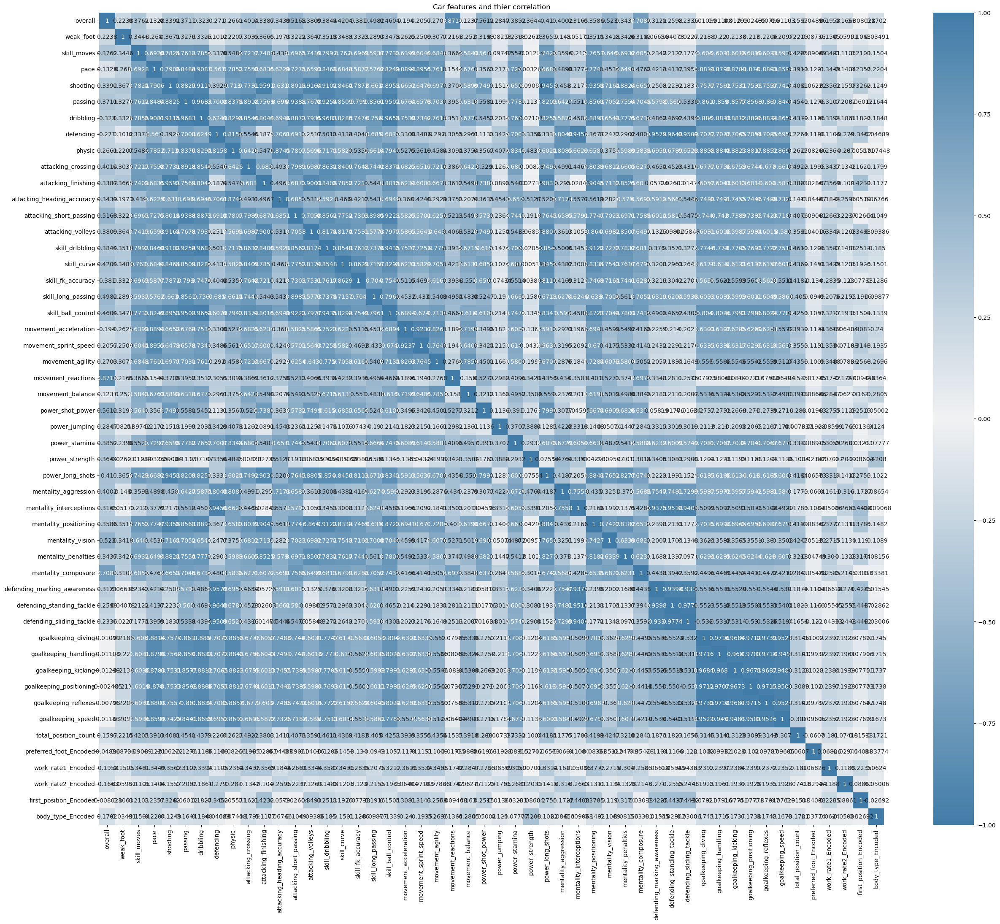

In [14]:
plot_correlation(player_df_new.corr(),figsize=(30,25))

> ## From the correlation matrix,it can be observed that there is high correlation between some  of the features

In [15]:
fig = px.imshow(player_df_new.corr(), text_auto=True)
fig.show()

In [16]:
player_df_new.shape

(19239, 50)

## Modelling

In [17]:
pl_df = player_df_new.drop(columns=['goalkeeping_speed'])

pl_df.head()

,overall,weak_foot,skill_moves,pace,shooting,passing,dribbling,defending,physic,attacking_crossing,...,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,total_position_count,preferred_foot_Encoded,work_rate1_Encoded,work_rate2_Encoded,first_position_Encoded,body_type_Encoded
sofifa_id,,,,,,,,,,,,,,,,,,,,,
158023,93,4,4,85.0,92.0,91.0,95.0,34.0,65.0,85,...,11,15,14,8,3,0,2,1,12,9
188545,92,4,4,78.0,92.0,79.0,86.0,44.0,82.0,71,...,6,12,8,10,1,1,0,2,14,9
20801,91,4,5,87.0,94.0,80.0,88.0,34.0,75.0,87,...,11,15,14,11,2,1,0,1,14,9
190871,91,5,5,91.0,83.0,86.0,94.0,37.0,63.0,85,...,9,15,15,11,2,1,0,2,8,9
192985,91,5,4,76.0,86.0,93.0,88.0,64.0,78.0,94,...,13,5,10,13,2,1,0,0,4,9


In [18]:

if 'pred_labels' in pl_df:
    pl_df = player_df.drop(columns=['pred_labels'])

if 'name' in pl_df:
    pl_df = player_df.drop(columns=['name'])



Creating a KMeans model using k value of 20

This is done because we have observed that there can be upto 27 different positions on a football pitch

### Clustering Evaluation

In [19]:
km = KMeans(n_clusters=20, random_state=124)
km.fit(pl_df)

pred_labels = km.labels_ 


In [20]:
from sklearn.metrics import silhouette_score



# Calculate and print the silhouette score
score = silhouette_score(pl_df, pred_labels)
print("Silhouette Score:", score)

Silhouette Score: 0.12646360957722616


### Clusters and their corresponding points

In [21]:
pl_df["pred_labels"] = pred_labels
pl_df["name"] = player_names

# get indices of each cluster and their points
cluster_dict = {i: pl_df.index[pl_df['pred_labels']==i].tolist() for i in range(km.n_clusters)}

pl_df.to_csv('models/male_pl_df.csv')
pl_df.head()

,overall,weak_foot,skill_moves,pace,shooting,passing,dribbling,defending,physic,attacking_crossing,...,goalkeeping_positioning,goalkeeping_reflexes,total_position_count,preferred_foot_Encoded,work_rate1_Encoded,work_rate2_Encoded,first_position_Encoded,body_type_Encoded,pred_labels,name
sofifa_id,,,,,,,,,,,,,,,,,,,,,
158023,93,4,4,85.0,92.0,91.0,95.0,34.0,65.0,85,...,14,8,3,0,2,1,12,9,5,L. Messi
188545,92,4,4,78.0,92.0,79.0,86.0,44.0,82.0,71,...,8,10,1,1,0,2,14,9,5,R. Lewandowski
20801,91,4,5,87.0,94.0,80.0,88.0,34.0,75.0,87,...,14,11,2,1,0,1,14,9,5,Cristiano Ronaldo
190871,91,5,5,91.0,83.0,86.0,94.0,37.0,63.0,85,...,15,11,2,1,0,2,8,9,5,Neymar Jr
192985,91,5,4,76.0,86.0,93.0,88.0,64.0,78.0,94,...,10,13,2,1,0,0,4,9,12,K. De Bruyne


### obtain player id 

In [22]:
pldf = pd.read_csv('models/male_pl_df.csv')
playerA_id = pldf[pldf['name']=="L. Messi"]['sofifa_id'].item()
playerA_id

158023

In [23]:
playerA_id = pldf[(pldf['name']=="Cristiano Ronaldo") & (pldf['overall']==91)]['sofifa_id'].item()
playerA_id

20801

###  Scatter Plot of the player clusters

In [24]:
fig = px.scatter_3d(pl_df, x='passing', y='overall', z='dribbling',
              color="pred_labels", log_x=True, hover_name="name", hover_data=["overall"])
fig.show()

We can see that players have been clustered based on their similarity
<li>Eg. Messi and Neymar are close to each other and are part of the same cluster 
<li> These clusters are almost analogous to their original player positions
Eg. Midfielders like Verratti and Thiago are in the same cluster  

## PCA


In [25]:
if 'pred_labels' in pl_df.columns:
    pl_df = pl_df.drop(columns=['pred_labels'])


if 'name' in pl_df.columns:
    pl_df = pl_df.drop(columns=['name'])

# try: 
X_std=pd.DataFrame(StandardScaler().fit_transform(pl_df),index=pl_df.index,columns=pl_df.columns)
X_std

,overall,weak_foot,skill_moves,pace,shooting,passing,dribbling,defending,physic,attacking_crossing,...,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,total_position_count,preferred_foot_Encoded,work_rate1_Encoded,work_rate2_Encoded,first_position_Encoded,body_type_Encoded
sofifa_id,,,,,,,,,,,,,,,,,,,,,
158023,3.957501,1.569295,2.146241,1.024453,2.153464,1.968245,1.819019,-0.537399,0.329387,1.964190,...,-0.308358,-0.063713,-0.130678,-0.474818,1.848041,-1.792891,0.697991,-0.716285,1.292493,2.997879
188545,3.812154,1.569295,2.146241,0.729901,2.153464,1.378341,1.403208,-0.088594,1.090178,1.187887,...,-0.605286,-0.244828,-0.482391,-0.362988,-0.911113,0.557758,-1.521254,0.570660,1.726475,2.997879
20801,3.666806,1.569295,3.448937,1.108610,2.248215,1.427500,1.495610,-0.537399,0.776911,2.075090,...,-0.308358,-0.063713,-0.130678,-0.307073,0.468464,0.557758,-1.521254,-0.716285,1.726475,2.997879
190871,3.666806,3.058403,3.448937,1.276925,1.727087,1.722452,1.772817,-0.402757,0.239882,1.964190,...,-0.427130,-0.063713,-0.072059,-0.307073,0.468464,0.557758,-1.521254,0.570660,0.424530,2.997879
192985,3.666806,3.058403,2.146241,0.645744,1.869213,2.066563,1.495610,0.809014,0.911169,2.463242,...,-0.189587,-0.667428,-0.365153,-0.195244,0.468464,0.557758,-1.521254,-2.003229,-0.443433,2.997879
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
261962,-2.728494,0.080187,-0.459150,-0.111674,-0.546927,-0.243895,-0.352440,-0.178355,-0.386652,-0.198369,...,-0.367744,-0.667428,-0.072059,-0.195244,-0.911113,0.557758,0.697991,0.570660,-0.877415,-1.326646
262040,-2.728494,0.080187,-0.459150,-0.069595,-0.357426,-0.047260,-0.444842,-0.223236,-0.297147,0.245233,...,-0.248973,-0.607056,-0.482391,-0.362988,-0.911113,0.557758,0.697991,0.570660,-0.443433,-1.326646
262760,-2.728494,0.080187,-0.459150,-0.027517,-0.452177,-0.293054,-0.306238,-0.223236,-0.252394,-0.586520,...,-0.605286,-0.546685,-0.365153,-0.586647,-0.911113,0.557758,0.697991,0.570660,-0.443433,-1.326646


In [26]:
pca = PCA()
principalcomponents = pca.fit_transform(X_std)

### Bar plot of variance ratio of each PC's

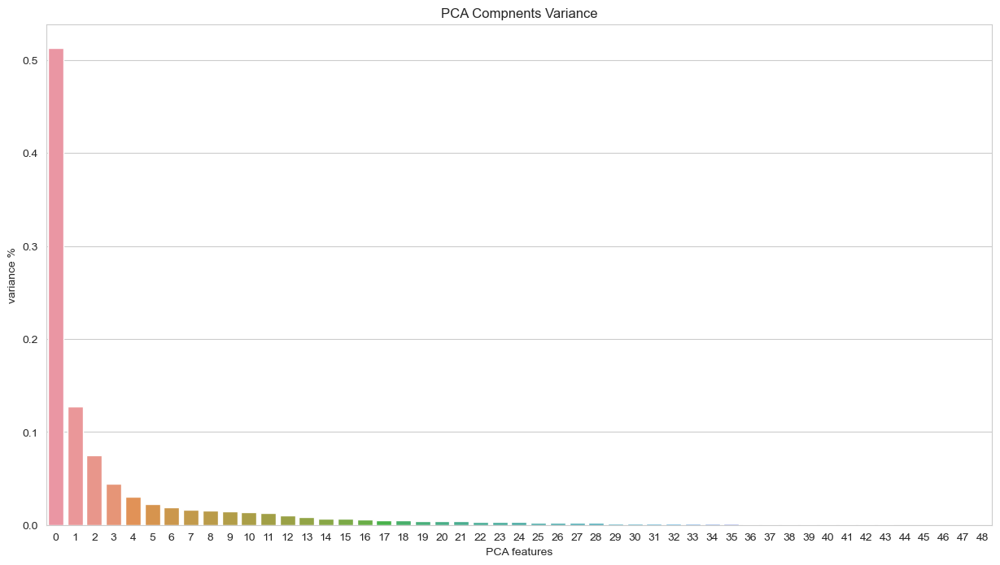

In [27]:
features = list(range(pca.n_components_))

plt.figure(figsize=(15,8))
sns.set_style('whitegrid')
sns.barplot(x=features, y=pca.explained_variance_ratio_, capsize=.2)
plt.title('PCA Compnents Variance')
plt.xlabel('PCA features')
plt.ylabel('variance %')
plt.xticks(features)
plt.show()

> ### The first 4 components are having the highest variance ratio and hence they will be chosen for modelling

In [28]:
PCA_components = pd.DataFrame(principalcomponents)
PCA_components['sofifa_id'] = pl_df.index
PCA_components.set_index('sofifa_id',inplace=True)
PCA_components.head()

,0,1,2,3,4,5,6,7,8,9,...,39,40,41,42,43,44,45,46,47,48
sofifa_id,,,,,,,,,,,,,,,,,,,,,
158023,-9.487960,-5.452532,5.605597,-0.578360,-0.329905,1.428386,-0.742513,1.428529,-2.693534,-1.005845,...,-0.325066,-0.111435,0.038218,-0.205580,-0.025516,-0.014056,-0.026737,0.002726,-0.012602,-0.025656
188545,-8.670262,-3.597223,6.061310,3.102560,-1.206948,0.406549,-1.270633,0.400448,0.756518,-0.083557,...,0.243177,0.245544,-0.223713,-0.530317,-0.136538,-0.068578,-0.020361,-0.015618,0.004184,-0.000148
20801,-9.140817,-4.881812,5.968269,2.624330,-2.037404,-0.073866,-0.308260,0.761441,-0.456701,-0.526441,...,-0.247752,-0.043024,0.134999,-0.178060,-0.044909,-0.073495,0.015230,-0.034582,0.013471,-0.016187
190871,-9.184619,-5.316562,4.807843,-0.624266,-1.061897,-0.546476,-1.175882,2.130537,0.468819,-0.398815,...,-0.243029,0.131464,0.072694,0.029777,0.030064,-0.045587,-0.040979,-0.013681,-0.008443,-0.007009
192985,-9.800229,-1.644998,6.452011,-0.738035,0.193892,-1.106858,1.069755,2.051114,0.020209,-0.356290,...,0.226373,-0.050032,-0.072142,-0.184091,-0.044561,0.000417,-0.006970,0.004367,-0.001382,0.001856


In [ ]:
from sklearn.cluster import KMedians

In [29]:
model = KMedians(n_clusters=20)

# Fit model to samples
model.fit(PCA_components.iloc[:,:4]) ## Using 4 feature components

pred_labels = model.labels_ 


In [30]:


# Calculate and print the silhouette score
score = silhouette_score(PCA_components.iloc[:,:4], pred_labels)
print("Silhouette Score:", score)

Silhouette Score: 0.24598559422668276


In [31]:


def kmeans_modelling(X,scaling=False):
    """Creating a function to find the best K value in terms of both scaled and unscaled data"""
    k_range = range(10,25)
    scores = []
    inertia = []
    if scaling == True:
        scaler = MinMaxScaler()
        X_scaled = scaler.fit_transform(X)
        #  convert numpy array to Dataframe
        X = pd.DataFrame(X_scaled,index=X.index,columns=X.columns)

    for k in tqdm(k_range):
            model = KMeans(n_clusters=k, random_state=124)
            model.fit(X)
            scores.append(metrics.silhouette_score(X, model.labels_))
            inertia.append(km.inertia_)
    return inertia, scores

In [32]:
unscaled_inertia, unscaled_sc = kmeans_modelling(PCA_components.iloc[:,:4], scaling=False)

100%|██████████| 15/15 [01:18<00:00,  5.24s/it]


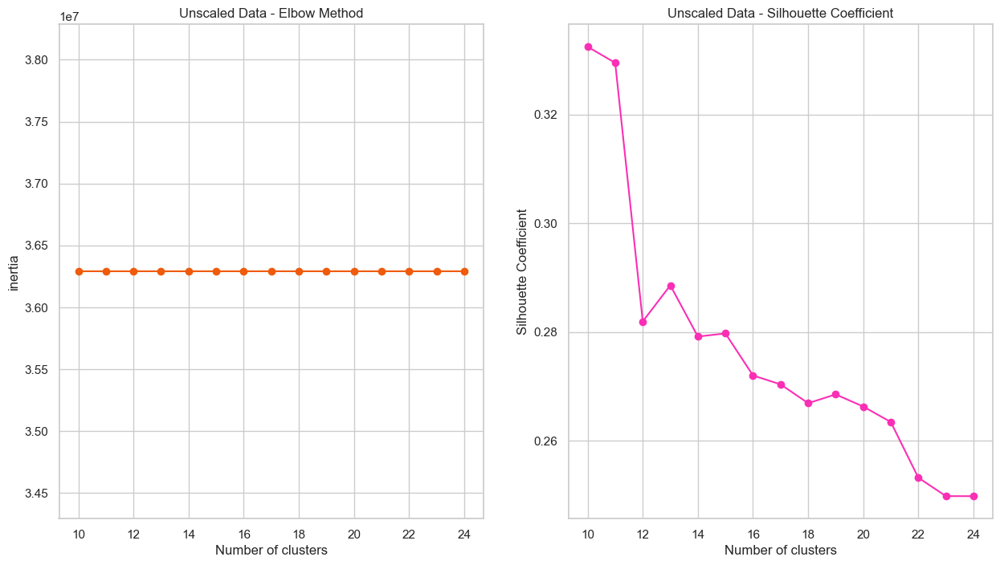

In [33]:
plot_cluster_evaluation(unscaled_inertia,unscaled_sc,range(10,25), "Unscaled Data - Elbow Method", "Unscaled Data - Silhouette Coefficient", )

In [34]:
PCA_components["pred_labels"] = pred_labels
PCA_components["name"] = player_names

# create a dictionary of clusters and their indices
cluster_dict = {i: pl_df.index[PCA_components['pred_labels']==i].tolist() for i in range(model.n_clusters)}


abilities=['dribbling','passing','overall','defending','physic','attacking_crossing','attacking_finishing','attacking_heading_accuracy','attacking_short_passing','attacking_volleys','skill_dribbling','skill_curve','skill_fk_accuracy',
            'skill_long_passing','skill_ball_control','movement_acceleration','movement_sprint_speed','movement_agility','movement_reactions','movement_balance','power_shot_power','power_jumping','power_stamina','power_strength',
            'power_long_shots','mentality_aggression','mentality_interceptions','mentality_positioning','mentality_vision','mentality_penalties','mentality_composure','defending_marking_awareness','defending_standing_tackle',
            'defending_sliding_tackle','goalkeeping_diving','goalkeeping_handling','goalkeeping_kicking','goalkeeping_positioning','goalkeeping_reflexes']

for col in abilities:
    PCA_components[col] = pl_df[col]

PCA_components.head()

,0,1,2,3,4,5,6,7,8,9,...,mentality_penalties,mentality_composure,defending_marking_awareness,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes
sofifa_id,,,,,,,,,,,,,,,,,,,,,
158023,-9.487960,-5.452532,5.605597,-0.578360,-0.329905,1.428386,-0.742513,1.428529,-2.693534,-1.005845,...,75,96,20,35,24,6,11,15,14,8
188545,-8.670262,-3.597223,6.061310,3.102560,-1.206948,0.406549,-1.270633,0.400448,0.756518,-0.083557,...,90,88,35,42,19,15,6,12,8,10
20801,-9.140817,-4.881812,5.968269,2.624330,-2.037404,-0.073866,-0.308260,0.761441,-0.456701,-0.526441,...,88,95,24,32,24,7,11,15,14,11
190871,-9.184619,-5.316562,4.807843,-0.624266,-1.061897,-0.546476,-1.175882,2.130537,0.468819,-0.398815,...,93,93,35,32,29,9,9,15,15,11
192985,-9.800229,-1.644998,6.452011,-0.738035,0.193892,-1.106858,1.069755,2.051114,0.020209,-0.356290,...,83,89,68,65,53,15,13,5,10,13


### Best ball carrier

In [35]:
fig = px.scatter_3d(PCA_components, x='passing', y='overall', z='dribbling',
              color="pred_labels", log_x=True, hover_name="name", hover_data=["overall"])
fig.show()


> ### We can see that the best ball carriers are Messi and Neymar

### Finding Keepers

In [36]:
fig = px.scatter_3d(PCA_components, x='goalkeeping_diving', y='goalkeeping_reflexes', z='goalkeeping_positioning',
              color="pred_labels", log_x=True, hover_name="name", hover_data=["passing"])
fig.show()

> ### From this we can see that KMeans(with PCA) produced great results

## DBSCAN

In [37]:
scaler = MinMaxScaler()

DBScan_df = pl_df[['goalkeeping_diving',
                   'goalkeeping_reflexes',
                   'goalkeeping_positioning',
                   'passing',
                   'pace']]

db = DBSCAN(eps=0.3, min_samples=7, n_jobs=-1).fit(DBScan_df) ## We played around with tweaking the epsilon value and minimum sample size.

# add the cluster labels to the columns
DBScan_df['pred_labels'] = db.labels_
DBScan_df['name'] = player_names


# Count the total number of clusters
n_clusters = len(set(pred_labels)) - (1 if -1 in pred_labels else 0)
n_clusters

25

In [38]:
fig = px.scatter_3d(DBScan_df, x='goalkeeping_diving', y='passing', z='goalkeeping_positioning',
              color="pred_labels", log_x=True, hover_name="name", hover_data=["pace"])

fig.show()

> ## DBSCAN could not produce great results with the data. 

Function to find top 5 similiar players

In [39]:
# saving prediction results to csv
PCA_components.to_csv('models/male_pca_result.csv')

In [40]:
def get_similiar_players(playerA_id,player_count=5):
    """
    find top 5 similiar players
    i/p: player_id
    """

    # find the cluster the player belongs to

 
    # find the cluster the player belongs
    cluster = PCA_components.loc[playerA_id]['pred_labels']

    # get the features of playerA
    playerA_data = PCA_components.loc[playerA_id].head()

    # get the other players in the same cluster
    cluster_indices = cluster_dict[cluster]


    # get the other players in the same cluster
    cluster_indices = cluster_dict[cluster]

    # initialise a temp dictionary to store player ids and distances
    dist_dict={}

    # iterate through each player in the cluster
    for player_id in cluster_indices:

        if(player_id != playerA_id):

        
            playerB_data = PCA_components.loc[player_id].head()
            dist = np.linalg.norm(playerA_data-playerB_data)
            dist_dict[player_id]=dist.round(4)
        
    # create a new dataframe to show the id and distance
    dist_df = pd.DataFrame(columns=['id','distance'])

    # add data to the dataframe
    dist_df['id'] = dist_dict.keys()
    dist_df['distance'] = dist_dict.values()
    dist_df.sort_values('distance',inplace=True)

    # shortlist players based on player count
    similiar_players = dist_df.head(player_count)
    
    name_list=[]

    for id in list(similiar_players['id']):
        name_list.append(player_df.loc[id]['short_name'])

    similiar_players['name'] =name_list

    return similiar_players

    


Players similiar to Messi

In [41]:
similiar_players = get_similiar_players(playerA_id=158023,player_count=10)
similiar_players

,id,distance,name
0,190871,1.1335,Neymar Jr
1,200104,2.0188,H. Son
4,211110,2.7796,P. Dybala
3,183898,2.8107,Á. Di María
23,216594,2.9252,N. Fekir
14,206113,3.0427,S. Gnabry
7,204485,3.1492,R. Mahrez
12,183277,3.1928,E. Hazard
13,188350,3.1958,M. Reus
5,233049,3.2065,J. Sancho


## Heirarchical Clustering

In [42]:
if 'pred_labels' in pl_df.columns:
    pl_df = pl_df.drop(columns=['pred_labels'])


if 'name' in pl_df.columns:
    pl_df = pl_df.drop(columns=['name'])

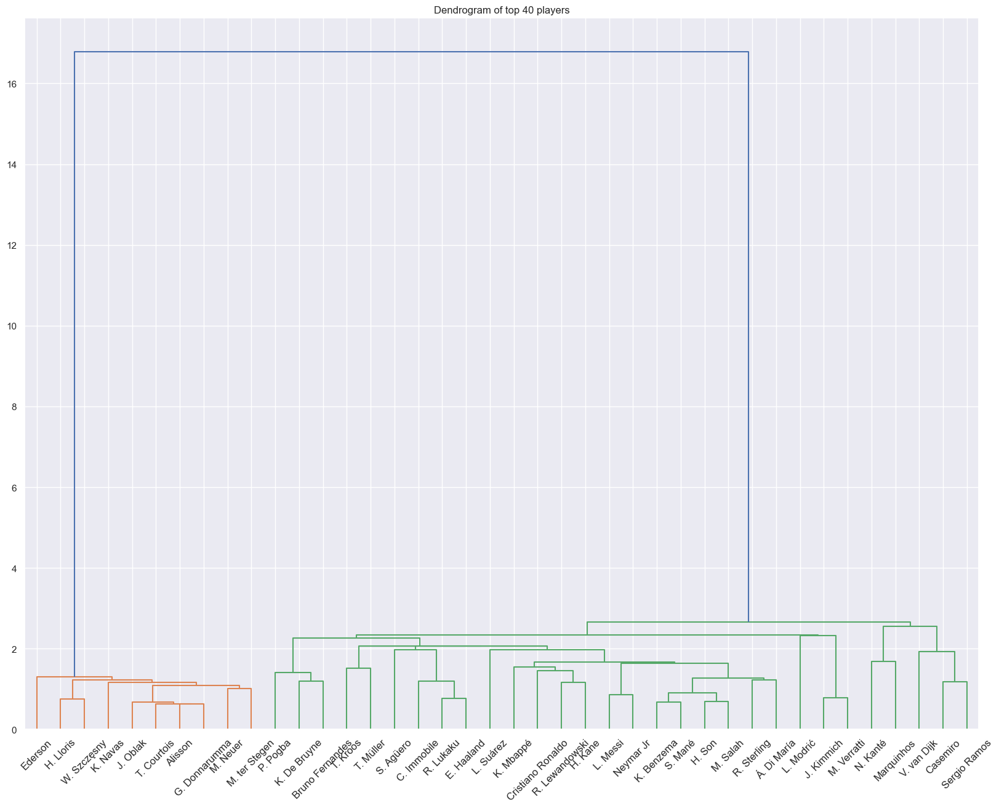

In [43]:
import scipy.cluster.hierarchy as shc


sns.set_style('darkgrid')

plt.figure(figsize=(20, 15))  
plt.title("Dendrogram of top 40 players")  


# create a dendrogram of top 40 players in the dataset
dend = shc.dendrogram(shc.linkage(PCA_components.iloc[:40,:4].values,method='single'),
                                    labels=list(player_names[:40]),
                                    leaf_rotation=45,
                                    leaf_font_size=12)


> ## using Heirachical Clustering, a dendrogram was generated for top 40 players

In [47]:
X=PCA_components.iloc[:,:4]

Using T-SNE for Dimensionality Reduction

In [48]:
from sklearn.manifold import TSNE

In [50]:
# Use t-SNE to reduce the dimensionality of the MNIST data to 2 dimensions
X_reduced = TSNE(n_components=2).fit_transform(X.values)



c:\Users\adity\.conda\envs\env_pytorch\lib\site-packages\sklearn\manifold\_t_sne.py:795: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.

c:\Users\adity\.conda\envs\env_pytorch\lib\site-packages\sklearn\manifold\_t_sne.py:805: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



NameError: name 'y' is not defined

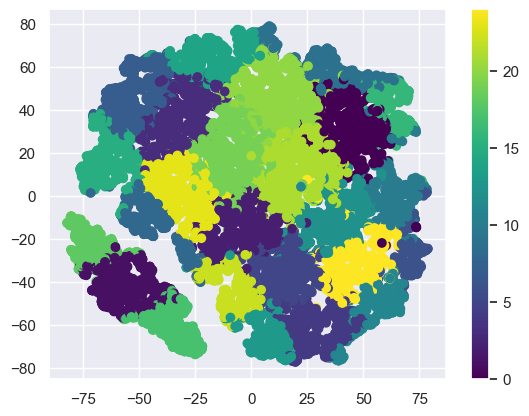

In [52]:
# Visualize the reduced data
import matplotlib.pyplot as plt
plt.scatter(X_reduced[:, 0], X_reduced[:, 1],c=pred_labels, cmap='viridis')
plt.colorbar()
plt.show()

In [67]:
# Train the k-means model
kmeans = KMeans(n_clusters=20).fit(X_reduced)
predictions = kmeans.predict(X_reduced)


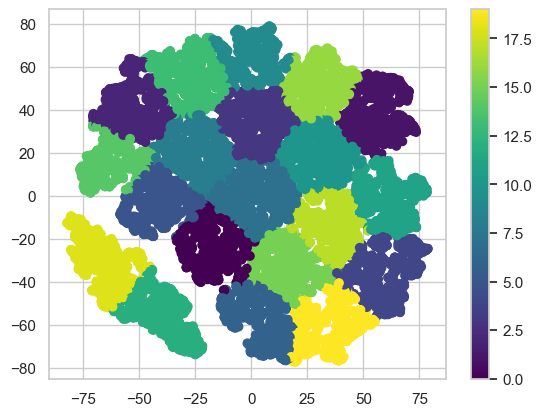

In [68]:
plt.scatter(X_reduced[:, 0], X_reduced[:, 1],c=predictions, cmap='viridis')
plt.colorbar()
plt.show()

In [69]:
unscaled_inertia, unscaled_sc = kmeans_modelling(X_reduced, scaling=False)

100%|██████████| 15/15 [02:14<00:00,  9.00s/it]


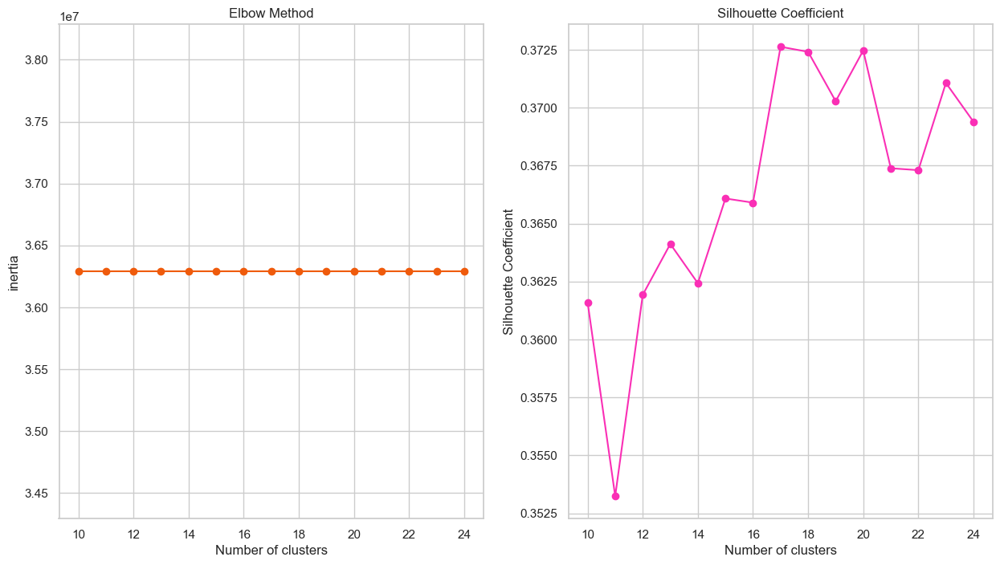

In [70]:
plot_cluster_evaluation(unscaled_inertia,unscaled_sc,range(10,25), "Elbow Method", "Silhouette Coefficient", )

In [71]:
X_reduced

array([[ 78.24698  ,   3.1592572],
       [ 78.62669  , -24.632832 ],
       [ 78.398766 ,   1.6589015],
       ...,
       [-47.224823 , -17.14542  ],
       [ -9.346497 , -56.65532  ],
       [-30.343683 , -29.535528 ]], dtype=float32)

In [72]:
PCA_components["pred_labels"] = predictions

In [73]:
fig = px.scatter_3d(PCA_components, x='passing', y='overall', z='dribbling',
              color="pred_labels", log_x=True, hover_name="name", hover_data=["overall"])
fig.show()
